# Машинное обучение, ФКН ВШЭ

# Практическое задание 11. Несбалансированные задачи

## Общая информация
Дата выдачи: 24.04.2025

Мягкий дедлайн: 13.05.2025 23:59 MSK

Жесткий дедлайн: 18.05.2025 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-xx-Username.ipynb

Username — ваша фамилия и имя на латинице именно в таком порядке

## О задании

В этом задании мы разберем основные техники работы в задачах, где один из классов занимает существенно меньшую долю выборки, чем остальные. Для простоты мы обойдемся бинарной задачей, тем не менее, во многом данные методы можно перенести и на задачи с б**о**льшим числом классов. Кроме того, вы получите очередной бесценный опыт исследования случайной библиотеки случайных индусов с нуля.

In [ ]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid')

from tqdm.auto import tqdm

**Задание -1 (1 балл)**. EDA

В качестве данных для нашей работы возьмем выложенный на kaggle датасет транзакций, в котором нужно выискивать мошеннические проводки: [клик](https://www.kaggle.com/mlg-ulb/creditcardfraud). Данная задача по определению подходит под несбалансированную, что можно сказать даже без наличия каких-либо данных (понятно, что среди всех транзакций клиентов очень малая часть будет мошеннической).

Загрузим данные, проведем некоторые классические манипуляции.

In [ ]:
"""%%bash
kaggle datasets download -d mlg-ulb/creditcardfraud
unzip creditcardfraud.zip;"""

In [ ]:
df = pd.read_csv('creditcard.csv')

Наши данные были анонимизированы. Мы имеем 30 признаков, из которых 28 - это результаты PCA-преобразования на исходном датасете. Еще 2 признака представляют собой время в секундах, прошедшее с момента первой транзакции в датасете, и размер транзакции. Скажите, какова доля положительных объектов в выборке?

In [ ]:
df[df['Class'] == 1].shape[0]

492

Начнем с обработки времени. Секунды сами по себе не несут большой информации о зависимостях в данных, попробуйте по ним создать признаки "час" (от 0 до 23) и "день" (от 0 до ...) в аналогичной манере (принимая первый объект выборки за начальную точку). Сколько дней покрывают данные?

In [ ]:
sec_per_day = 60*60*24
sec_per_hour = 60*60

df['day'] = df['Time'].apply(lambda x: int(x / sec_per_day) + 1)
df['hour'] = df['Time'].apply(lambda x: int((x % sec_per_day) / sec_per_hour))

In [ ]:
df['day'].max()

2

Данные покрывают два дня

Постройте следующие графики:

1. Распределение числа транзакций по каждому часу (line-plot).
2. Распределение доли мошеннических транзакций по каждому часу (line-plot)
3. То же самое для дней (здесь можно использовать bar-plot, так как дней должно быть немного).

Какие выводы можно сделать из графиков? На ваш взгляд, как можно связать полученные нами часы с реальными часами в сутках?

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=2, subplot_titles=(
    "Distribution of number of transactions per hour",
    "Distribution of share of fraudulent transactions per hour",
    "Distribution of number of transactions per day",
    "Distribution of share of fraudulent transactions per day"
))

transactions_per_hour = df.groupby('hour').size()
fraud_per_hour = df[df['Class'] == 1].groupby('hour').size() / transactions_per_hour

transactions_per_day = df.groupby('day').size()
fraud_per_day = df[df['Class'] == 1].groupby('day').size() / transactions_per_day

fig.add_trace(go.Scatter(x=transactions_per_hour.index, y=transactions_per_hour.values, mode='lines', name='Transactions per hour'), row=1, col=1)
fig.add_trace(go.Scatter(x=fraud_per_hour.index, y=fraud_per_hour.values, mode='lines', name='Fraud share per hour'), row=1, col=2)

fig.add_trace(go.Bar(x=transactions_per_day.index, y=transactions_per_day.values, name='Transactions per day'), row=2, col=1)
fig.add_trace(go.Bar(x=fraud_per_day.index, y=fraud_per_day.values, name='Fraud share per day'), row=2, col=2)

fig.update_layout(title_text="Distributions of transactions", height=800, width=1000)
for i, annotation in enumerate(fig['layout']['annotations']):
    if (i % 2) == 1:
        annotation['x'] += 0.05

fig.show()

С анонимизированными признаками вряд ли можно придумать что-то интересное. Попробуйте (например, с помощью корреляции?) выбрать несколько наиболее важных признаков и поглядеть на различия в их распределении для разных классов.

In [ ]:
corr_matrix = df.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
corr_pairs = upper.stack().reset_index()
corr_pairs.columns = ['Feature1', 'Feature2', 'Correlation']

top_corr = corr_pairs.sort_values(by='Correlation', ascending=False)
print(top_corr.head(6))

    Feature1 Feature2  Correlation
30      Time      day     0.896490
89        V2   Amount     0.531409
120       V3      day     0.450604
2       Time       V3     0.419618
31      Time     hour     0.415575
224       V7   Amount     0.397311


In [ ]:
fig = make_subplots(rows=3, cols=2, subplot_titles=(
    "V2 - Amount (All)", "V2 - Amount (Fraud)",
    "V3 - day (All)", "V3 - day (Fraud)",
    "V7 - Amount (All)", "V7 - Amount (Fraud)"
))

fraud = df[df['Class'] == 1]

fig.add_trace(go.Scatter(x=df['V2'], y=df['Amount'], mode='lines', name='All'), row=1, col=1)
fig.add_trace(go.Scatter(x=fraud['V2'], y=fraud['Amount'], mode='lines', name='Fraud'), row=1, col=2)

fig.add_trace(go.Bar(x=df['day'], y=df['V3'], name='Transactions per day'), row=2, col=1)
fig.add_trace(go.Bar(x=fraud['day'], y=fraud['V3'], name='Fraud share per day'), row=2, col=2)


fig.add_trace(go.Scatter(x=df['V7'], y=df['Amount'], mode='lines', name='All'), row=3, col=1)
fig.add_trace(go.Scatter(x=fraud['V7'], y=fraud['Amount'], mode='lines', name='Fraud'), row=3, col=2)

fig.update_layout(
    title_text="Distributions of Top Correlated Features",
    height=900,
    width=1000
)

for i, annotation in enumerate(fig['layout']['annotations']):
    if (i % 2) == 1:
        annotation['x'] += 0.05

fig.show()

Теперь давайте разделим данные. Отделите хронологически последние 20% транзакций и поделите их пополам (также хронологически, т.е. без перемешивания) на валидационные и тестовые. Это разбиение не совсем корректно (как можно было заметить, мошеннические транзакции имеют разное распределение во времени - по-хорошему, нам стоило бы выделить целые сутки записей как под валидацию, так и под тест), тем не менее, мы не сможем получить больше данных для адекватного контроля, поэтому обойдемся этим.

In [ ]:
from sklearn.model_selection import train_test_split

threshold = df['Time'].quantile(0.8)
last_transactions = df[df['Time'] >= threshold].sort_values('Time')

val, test = train_test_split(
    last_transactions,
    test_size=0.5,
    shuffle=False
)

# Часть 1. Несбалансированная классификация.

**Задание 0. (1 балл)**: перед началом работы давайте поговорим о том, как мы будем оценивать качество. Классические метрики для качества классификации чаще всего "ломаются" на задачах с сильным перекосом. Чему будет равно значение accuracy для наивного предсказания (= мажорный класс для каждого объекта)? (можете не отвечать, просто подумайте)

Из курса МО-1 вам уже известно, что мы можем использовать в таких задачах `AUC-PR` и получать адекватные показатели. Можно сказать, что `AUC-PR` представляет собой матожидание `precision` по распределению, заданному выигрышем в `recall` при смене порога.

In [ ]:
from sklearn.metrics import auc, precision_recall_curve

Тем не менее, существуют и другие, не менее интересные метрики. Одной из таких метрик является коэффициент Каппа Коэна, представляющий собой нормализованную `accuracy`:

$$\kappa = \frac{p_o - p_e}{1 - p_e}$$

Данная метрика служит в качестве меры согласованности между двумя независимыми предсказателями, но ничего не знает про "верные" и "предсказанные" метки (в отличие от многих других метрик машинного обучения). Здесь $p_o$ - доля согласованных предсказаний, а $p_e$ - доля согласованных предсказаний, которая могла бы получиться при случайных ответах предсказателей. В нашем случае это работает так:

• В качестве $p_o$ берем accuracy

• В качестве $p_e$ примем следующую величину - вероятность случайного соглашения позитивных ответов (произведение долей позитивных ответов в обоих предсказаниях) плюс вероятность случайного соглашения негативных ответов (произведение долей негативных ответов в обоих предсказаниях)

Метрика принимает значения от -1 до 1, где 1 - полная согласованность, 0 - согласованность на уровне рандома, -1 - совсем плохо. Как уже говорилось, метрика не различает "верные" и "предсказанные" метки, поэтому является симметричной (можете использовать это для отладки):

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score

def compute_cohen_kappa(y_true, y_pred):

    po = accuracy_score(y_true, y_pred)

    p_true_pos = np.mean(y_true == 1)
    p_pred_pos = np.mean(y_pred == 1)
    p_true_neg = np.mean(y_true == 0)
    p_pred_neg = np.mean(y_pred == 0)

    pe = p_true_pos * p_pred_pos + p_true_neg * p_pred_neg

    kappa = (po - pe) / (1 - pe) if (1 - pe) != 0 else 0

    return kappa

Еще одной метрикой в такой задаче служит коэффициент корреляции Мэтьюза, выражающийся в терминах матрицы ошибок следующим образом:

$$\text{MCC} = \frac{TP\times TN - FP \times FN}{\sqrt{(TP+FP)(TP+FN)(TN+FP)(TN+FN)}}$$

Метрика принимает значения от -1 до 1, интерпретируемые аналогичным образом.

In [ ]:
from sklearn.metrics import matthews_corrcoef

Обратите внимание, что эти метрики вычисляются на бинаризованных предсказаниях, поэтому может иметь смысл дополнительная настройка порога бинаризации.

Давайте проверим, что наши метрики действительно подходят под задачу. Вычислите их значения для наивного предсказания (aka мажорный класс для всех объектов):

In [ ]:
from tabulate import tabulate

In [ ]:
y_true = df['Class']

most_common_class = y_true.value_counts().idxmax()
y_naive = np.full_like(y_true, fill_value=most_common_class)

precision_naive, recall_naive, _ = precision_recall_curve(y_true, y_naive)
auc_precision_recall_naive = auc(recall_naive, precision_naive)

kappa_naive = compute_cohen_kappa(y_true, y_naive)
matthews_naive = matthews_corrcoef(y_true, y_naive)


table_1 = [['Naive', auc_precision_recall_naive, kappa_naive, matthews_naive]]
print(tabulate(table_1, headers=["Model", "AUC_PR", "Cohen_Kappa", "Matthews"]))

Model      AUC_PR    Cohen_Kappa    Matthews
-------  --------  -------------  ----------
Naive    0.500864              0           0


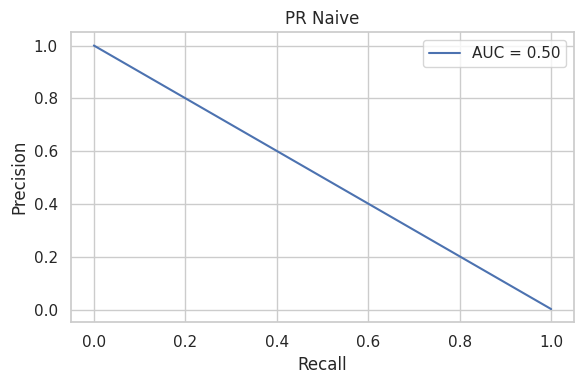

In [ ]:
plt.figure(figsize=(6, 4))
plt.plot(recall_naive, precision_naive, label=f'AUC = {auc_precision_recall_naive:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR Naive')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Давайте запустим бейзлайн-решение для нашей задачи. С чего же начнем? Возьмите `catboost` и обучите его классификатор на наших данных (используйте все признаки). Вычислите значения всех метрик на тестовой части, для контроля переобучения используйте валидационную (здесь и далее везде, где фигурирует `catboost`).

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 6.2 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostClassifier

In [ ]:
transactions_for_train = df[df['Time'] < threshold].sort_values('Time')
X_train = transactions_for_train.drop(columns=['Class', 'naive_prediction'])
y_train = transactions_for_train['Class']

X_val = val.drop(columns=['Class'])
y_val = val['Class']

X_test = test.drop(columns=['Class'])
y_test = test['Class']

model = CatBoostClassifier(verbose=0)
model.fit(X_train, y_train,
    eval_set=(X_val, y_val)
)
y_proba_baseline = model.predict_proba(X_test)[:, 1]
y_baseline = (y_proba_baseline >= 0.5).astype(int)
precision_baseline, recall_baseline, _ = precision_recall_curve(y_test, y_proba_baseline)
auc_precision_recall_baseline = auc(recall_baseline, precision_baseline)

kappa_baseline = compute_cohen_kappa(y_test, y_baseline)
matthews_baseline = matthews_corrcoef(y_test, y_baseline)


table_2 = [['Naive', auc_precision_recall_naive, kappa_naive, matthews_naive],
           ['Baseline', auc_precision_recall_baseline, kappa_baseline, matthews_baseline]]
print(tabulate(table_2, headers=["Model", "AUC_PR", "Cohen_Kappa", "Matthews"]))

Model       AUC_PR    Cohen_Kappa    Matthews
--------  --------  -------------  ----------
Naive     0.500864       0           0
Baseline  0.696818       0.717759    0.723739


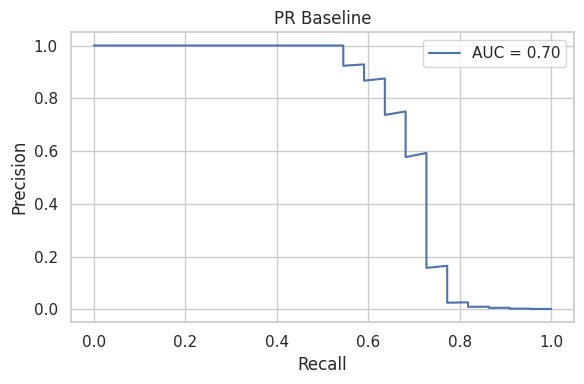

In [ ]:
plt.figure(figsize=(6, 4))
plt.plot(recall_baseline, precision_baseline, label=f'AUC = {auc_precision_recall_baseline:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('PR Baseline')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

Если вы все сделали правильно, у вас должны были получиться значения в районе 0.7.

**Задание 1. (1 балл)**. Многие реализации методов предлагают встроенные способы для борьбы с нашей проблемой. Самое часто встречающееся решение - просто добавить вес в функции потерь для минорного класса (таким образом, ошибка на объекте минорного класса будет весить больше, чем для мажорного). В `catboost` это также реализовано, причем для бинарной задачи это можно сделать целыми двумя способами (можете выбрать любой, на свой вкус, автор задания предпочитает отдельный скейлинг для минорного класса). Чаще всего в качестве веса берется отношение числа объектов мажорного класса к числу минорного. Попробуйте обучить модель с таким скалированием и сравните метрики на тестовой части с бейзлайном.

In [ ]:
model = CatBoostClassifier(verbose=0, auto_class_weights='Balanced')
model.fit(X_train, y_train,
    eval_set=(X_val, y_val)
)
y_proba_weight = model.predict_proba(X_test)[:, 1]
y_weight = (y_proba_weight >= 0.5).astype(int)
precision_weight, recall_weight, _ = precision_recall_curve(y_test, y_proba_weight)
auc_precision_recall_weight = auc(recall_weight, precision_weight)

kappa_weight = compute_cohen_kappa(y_test, y_weight)
matthews_weight = matthews_corrcoef(y_test, y_weight)


table_3 = [['Naive', auc_precision_recall_naive, kappa_naive, matthews_naive],
           ['Baseline', auc_precision_recall_baseline, kappa_baseline, matthews_baseline],
           ['Minority weight', auc_precision_recall_weight, kappa_weight, matthews_weight]]
print(tabulate(table_3, headers=["Model", "AUC_PR", "Cohen_Kappa", "Matthews"]))

Model              AUC_PR    Cohen_Kappa    Matthews
---------------  --------  -------------  ----------
Naive            0.500864       0           0
Baseline         0.696818       0.717759    0.723739
Minority weight  0.678751       0.179681    0.272793


Поскольку данный вес будет являться гиперпараметром метода, было бы опрометчиво остановиться на одном значении (тем более, с большой вероятностью у вас все сломалось). Запустите перебор для этого гиперпараметра на валидационной выборке (используйте `PR-AUC`), подберите оптимальный порог бинаризации для $\kappa$ или $\text{MCC}$. Для лучшего найденного веса и порога вычислите все метрики на тестовой части.

При этом можете также проверить отдельное скалирование в большую сторону для мажорного класса (т.е. веса минорного сделать меньше 1) и экстремальные скалирования (т.е. веса минорного больше, чем в начале этого задания). Какой вес получился оптимальным?

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, PredefinedSplit

model = CatBoostClassifier(verbose=0)

param_grid = {
    'scale_pos_weight': [100, 300, 400, 500, 600, 700]
}
X_search = pd.concat([X_train, X_val])
y_search = pd.concat([y_train, y_val])

split_index = [-1]*len(X_train) + [0]*len(X_val)
ps = PredefinedSplit(test_fold=split_index)

random_search = RandomizedSearchCV(
    model,
    param_distributions=param_grid,
    scoring='average_precision',
    cv=ps,
    n_jobs=-1,
    random_state=42
)

random_search.fit(X_search, y_search)
best_params = random_search.best_params_
best_model = random_search.best_estimator_

y_val_proba = best_model.predict_proba(X_val)[:, 1]

thresholds = np.linspace(0.0, 1.0, 50)
k_scores = []
m_scores = []

for t in thresholds:
    y_pred_opt = (y_val_proba >= t).astype(int)
    score_k = compute_cohen_kappa(y_val, y_pred_opt)
    k_scores.append(score_k)
    score_m = matthews_corrcoef(y_val, y_pred_opt)
    m_scores.append(score_m)

best_threshold_k = thresholds[np.argmax(k_scores)]
best_threshold_m = thresholds[np.argmax(m_scores)]

y_val_proba_opt = best_model.predict_proba(X_test)[:, 1]
precision_opt, recall_opt, _ = precision_recall_curve(y_test, y_val_proba_opt)
auc_precision_recall_opt = auc(recall_opt, precision_opt)

y_opt_k = (y_val_proba_opt >= best_threshold_k).astype(int)
kappa_opt = compute_cohen_kappa(y_test, y_opt_k)
y_opt_m = (y_val_proba_opt >= best_threshold_m).astype(int)
matthews_opt = matthews_corrcoef(y_test, y_opt_m)

table_4 = [['Naive', auc_precision_recall_naive, kappa_naive, matthews_naive],
           ['Baseline', auc_precision_recall_baseline, kappa_baseline, matthews_baseline],
           ['Minority weight', auc_precision_recall_weight, kappa_weight, matthews_weight],
           ['Minority weight optimised', auc_precision_recall_opt, kappa_opt, matthews_opt]]
print(tabulate(table_4, headers=["Model", "AUC_PR", "Cohen_Kappa", "Matthews"]))

/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_search.py:317: UserWarning: The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Model                        AUC_PR    Cohen_Kappa    Matthews
-------------------------  --------  -------------  ----------
Naive                      0.500864       0           0
Baseline                   0.696818       0.717759    0.723739
Minority weight            0.678751       0.179681    0.272793
Minority weight optimised  0.709089       0.58143     0.593443


**Задание 2. (1 балл)**. На самом деле, то, что мы сейчас делали, очень схоже с другой распространенной техникой - оверсэмплингом. Фактически, мы можем продублировать все объекты минорного класса и получить тот же эффект, какой был бы при использовании веса, равного 2. Тем не менее, такой подход - это лишь малая часть того, что мы можем проделать с целью повысить число объектов минорного класса.

Для продолжения работы установим библиотеку [imbalanced-learn](https://imbalanced-learn.org/stable/):

In [ ]:
!pip3 install imbalanced-learn
# conda install -c conda-forge imbalanced-learn

Первый метод, которым мы воспользуемся, называется SMOTE (его вы уже разбирали на лекции). Кратко напомним суть: мы выбираем случайного кандидата среди $k$ ближайших соседей объекта минорного класса, затем берем точку на отрезке между двумя объектами (т.е. выпуклую комбинацию со случайными коэффициентами) и добавляем в выборку.

In [ ]:
from imblearn.over_sampling import SMOTE

Используйте SMOTE для ресэмплинга обучающей выборки, на новой выборке обучите модель (вес положительных объектов скалировать не нужно). Замерьте качество на тестовой выборке (**важно!** не преобразовывайте валидационную и тестовую выборку никак - мы не хотим отслеживать качество на объектах, которых в реальности не существует). Сравните полное выравнивание выборки с частичным (т.е. таким, что баланс классов улучшается, но не достигает равенства - скажем, 1:2 и 1:10).

In [ ]:
sm_full = SMOTE(sampling_strategy='minority', random_state=42)
X_res, y_res = sm_full.fit_resample(X_train, y_train)

model_full = CatBoostClassifier(verbose=0)
model_full.fit(X_res, y_res,
    eval_set=(X_val, y_val)
)
y_proba_smote_full = model_full.predict_proba(X_test)[:, 1]
y_smote_full = (y_proba_smote_full >= 0.5).astype(int)
precision_smote_full, recall_smote_full, _ = precision_recall_curve(y_test, y_proba_smote_full)
auc_precision_recall_smote_full = auc(recall_smote_full, precision_smote_full)

kappa_smote_full = compute_cohen_kappa(y_test, y_smote_full)
matthews_smote_full = matthews_corrcoef(y_test, y_smote_full)

sm_part = SMOTE(sampling_strategy=0.1, random_state=42)
X_res_part, y_res_part = sm_part.fit_resample(X_train, y_train)

model_part = CatBoostClassifier(verbose=0)
model_part.fit(X_res_part, y_res_part,
    eval_set=(X_val, y_val)
)
y_proba_smote_part = model_part.predict_proba(X_test)[:, 1]
y_smote_part = (y_proba_smote_part>= 0.5).astype(int)
precision_smote_part, recall_smote_part, _ = precision_recall_curve(y_test, y_proba_smote_part)
auc_precision_recall_smote_part = auc(recall_smote_part, precision_smote_part)

kappa_smote_part = compute_cohen_kappa(y_test, y_smote_part)
matthews_smote_part = matthews_corrcoef(y_test, y_smote_part)


table_3 = [['SMOTE Full', auc_precision_recall_smote_full, kappa_smote_full, matthews_smote_full],
           ['SMOTE Part', auc_precision_recall_smote_part, kappa_smote_part, matthews_smote_part]]
print(tabulate(table_3, headers=["Model", "AUC_PR", "Cohen_Kappa", "Matthews"]))

Model         AUC_PR    Cohen_Kappa    Matthews
----------  --------  -------------  ----------
SMOTE Full  0.693806       0.627123    0.633126
SMOTE Part  0.734066       0.727062    0.727062


**Бонус (1.5 балла)**. Для vanilla SMOTE существуют некоторые модификации, часть из которых была реализована в библиотеке imblearn. Во время лекций/семинаров эти модификации не рассматривались, тем не менее, мы все равно их исследуем.

Найдите статьи о следующих методах и попробуйте вкратце сформулировать, в чем их основная идея (сделайте так, чтобы человек, знакомый с машинным обучением в целом, но не слышавший конкретно про это смог понять):

**BorderlineSMOTE** - этот метод оверсемплирования минорного класса делает акцент только на те значения минорного класса, которые находятся рядом с мажоритарным классом (в отличие от обычного SMOTE, где сэмплироваться могут и те, которые далеко от границы между классами). Алгоритм заключается в следующем: считаем k ближайших соседей для каждого объекта миноритарного класса и смотрим, сколько среди них представителей миноритарного и мажоритарного классов. Если среди ближайших соседей количество объектов мажоритарного класса превышают определенный порог, то такой объект добавляется в список тех, рядом с кем нужно сгенерировать новые объекты, это так называемая «опасная зона» (DANGER), в которой выше вероятность ошибочной классификации. Далее синтетические примеры создаются, как в обычном SMOTE — между объектом из DANGER и его ближайшими положительными соседями. Есть два варианта реализации: BorderlineSMOTE-1 и BorderlineSMOTE-2. Во втором дополнительно создаются точки в направлении ближайших объектов мажоритарного класса — они тоже относятся к миноритарному классу, но помогают лучше обучить границу между классами.

**SVM-SMOTE** - отличается от обычного SMOTE тем, что для выбора точек, от которых будут генерироваться новые объекты, используется SVM. Алгоритм работает так: сначала SVM строит разделяющую гиперплоскость между классами, после чего выбираются миноритарные объекты, находящиеся близко к этой границе (то есть те, что находятся в зоне наибольшей неопределённости). Затем из этих граничных точек синтезируются новые данные.

**K-Means-SMOTE** - метод, который позволяет снизить не только межгрупповую дисперсию, но и внутригрупповую. Алгоритм состоит из трёх этапов: кластеризации, фильтрации и сэмплирования. Сначала вся выборка разбивается на k кластеров с помощью алгоритма K-Means. Затем отбираются те кластеры, в которых преобладает миноритарный класс или его доля выше заданного порога. После этого оценивается разреженность объектов миноритарного класса внутри каждого кластера (в более разреженных кластерах будет сгенерировано больше синтетических примеров). Далее внутри каждого выбранного кластера применяется SMOTE, где количество новых объектов рассчитывается пропорционально разреженности и доле миноритарного класса в кластере.

**ADASYN** - для каждого сэмпла минорного класса считаются k ближайших соседей. По этим k ближайшим соседям определяется доля объектов мажоритарного класса — то есть насколько "трудно" классифицировать данный объект. Затем все такие оценки нормализуются, чтобы понять, на какую долю новых объектов должен приходиться каждый сэмпл минорного класса. Генерация новых данных происходит пропорционально этим значениям: чем больше рядом объектов мажоритарного класса, тем больше новых примеров будет сгенерировано для данного сэмпла.

Теперь попробуйте сравнить качество всех методов на наших данных.

Статьи:

[1] Felix Last, Georgios Douzas, Fernando Bacao, “Oversampling for Imbalanced Learning Based on K-Means and SMOTE” https://arxiv.org/abs/1711.00837

[2] He, Haibo, Yang Bai, Edwardo A. Garcia, and Shutao Li. “ADASYN: Adaptive synthetic sampling approach for imbalanced learning,” In IEEE International Joint Conference on Neural Networks (IEEE World Congress on Computational Intelligence), pp. 1322-1328, 2008.

[3] N. V. Chawla, K. W. Bowyer, L. O.Hall, W. P. Kegelmeyer, “SMOTE: synthetic minority over-sampling technique,” Journal of artificial intelligence research, 321-357, 2002.

[4] H. Han, W. Wen-Yuan, M. Bing-Huan, “Borderline-SMOTE: a new over-sampling method in imbalanced data sets learning,” Advances in intelligent computing, 878-887, 2005.



In [ ]:
from imblearn.over_sampling import BorderlineSMOTE, SVMSMOTE, KMeansSMOTE, ADASYN

In [ ]:
# -------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------
# BorderlineSMOTE
# -------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------

sm_borderline = BorderlineSMOTE(sampling_strategy='minority', random_state=42)
X_res_borderline, y_res_borderline = sm_borderline.fit_resample(X_train, y_train)

model_borderline = CatBoostClassifier(verbose=0)
model_borderline.fit(X_res_borderline, y_res_borderline,
    eval_set=(X_val, y_val)
)
y_proba_smote_borderline = model_borderline.predict_proba(X_test)[:, 1]
y_smote_borderline = (y_proba_smote_borderline >= 0.5).astype(int)
precision_smote_borderline, recall_smote_borderline, _ = precision_recall_curve(y_test, y_proba_smote_borderline)
auc_precision_recall_smote_borderline = auc(recall_smote_borderline, precision_smote_borderline)

kappa_smote_borderline = compute_cohen_kappa(y_test, y_smote_borderline)
matthews_smote_borderline = matthews_corrcoef(y_test, y_smote_borderline)

# -------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------
# SVMSMOTE
# -------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------

sm_svm = SVMSMOTE(sampling_strategy='minority', random_state=42)
X_res_svm, y_res_svm = sm_svm.fit_resample(X_train, y_train)

model_svm = CatBoostClassifier(verbose=0)
model_svm.fit(X_res_svm, y_res_svm,
    eval_set=(X_val, y_val)
)
y_proba_smote_svm = model_svm.predict_proba(X_test)[:, 1]
y_smote_svm = (y_proba_smote_svm>= 0.5).astype(int)
precision_smote_svm, recall_smote_svm, _ = precision_recall_curve(y_test, y_proba_smote_svm)
auc_precision_recall_smote_svm = auc(recall_smote_svm, precision_smote_svm)

kappa_smote_svm = compute_cohen_kappa(y_test, y_smote_svm)
matthews_smote_svm = matthews_corrcoef(y_test, y_smote_svm)

# -------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------
# KMeansSMOTE
# -------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------

sm_kmeans =  KMeansSMOTE(sampling_strategy='minority', random_state=42, kmeans_estimator=20, cluster_balance_threshold=0.001)
X_res_kmeans, y_res_kmeans = sm_kmeans.fit_resample(X_train, y_train)

model_kmeans = CatBoostClassifier(verbose=0)
model_kmeans.fit(X_res_kmeans, y_res_kmeans,
    eval_set=(X_val, y_val)
)
y_proba_smote_kmeans = model_kmeans.predict_proba(X_test)[:, 1]
y_smote_kmeans = (y_proba_smote_kmeans >= 0.5).astype(int)
precision_smote_kmeans, recall_smote_kmeans, _ = precision_recall_curve(y_test, y_proba_smote_kmeans)
auc_precision_recall_smote_kmeans = auc(recall_smote_kmeans, precision_smote_kmeans)

kappa_smote_kmeans = compute_cohen_kappa(y_test, y_smote_kmeans)
matthews_smote_kmeans = matthews_corrcoef(y_test, y_smote_kmeans)

# -------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------
# ADASYN
# -------------------------------------------------------------------------------------------------------------------------------
# -------------------------------------------------------------------------------------------------------------------------------

sm_ada = ADASYN(sampling_strategy='minority', random_state=42)
X_res_ada, y_res_ada = sm_ada.fit_resample(X_train, y_train)

model_ada = CatBoostClassifier(verbose=0)
model_ada.fit(X_res_ada, y_res_ada,
    eval_set=(X_val, y_val)
)
y_proba_smote_ada = model_ada.predict_proba(X_test)[:, 1]
y_smote_ada = (y_proba_smote_ada>= 0.5).astype(int)
precision_smote_ada, recall_smote_ada, _ = precision_recall_curve(y_test, y_proba_smote_ada)
auc_precision_recall_smote_ada = auc(recall_smote_ada, precision_smote_ada)

kappa_smote_ada = compute_cohen_kappa(y_test, y_smote_ada)
matthews_smote_ada = matthews_corrcoef(y_test, y_smote_ada)


table_5 = [['SMOTE Full', auc_precision_recall_smote_full, kappa_smote_full, matthews_smote_full],
           ['SMOTE Part', auc_precision_recall_smote_part, kappa_smote_part, matthews_smote_part],
           ['BorderlineSMOTE', auc_precision_recall_smote_borderline, kappa_smote_borderline, matthews_smote_borderline],
           ['SMOTE SVM', auc_precision_recall_smote_svm, kappa_smote_svm, matthews_smote_svm],
           ['KMeansSMOTE', auc_precision_recall_smote_kmeans, kappa_smote_kmeans, matthews_smote_kmeans],
           ['ADASYN', auc_precision_recall_smote_ada, kappa_smote_ada, matthews_smote_ada]]
print(tabulate(table_5, headers=["Model", "AUC_PR", "Cohen_Kappa", "Matthews"]))

Model              AUC_PR    Cohen_Kappa    Matthews
---------------  --------  -------------  ----------
SMOTE Full       0.693806       0.627123    0.633126
SMOTE Part       0.734066       0.727062    0.727062
BorderlineSMOTE  0.687664       0.743993    0.744194
SMOTE SVM        0.69256        0.743993    0.744194
KMeansSMOTE      0.68561        0.769075    0.775483
ADASYN           0.726623       0.571026    0.584632


**Задание 3. (1 балл)**. До этого момента все наши решения концентрировались на работе с минорным классом. Теперь давайте попробуем зайти с другой стороны. Может быть, для восстановления закономерностей нам не нужно столько объектов мажорного класса, и они просто засоряют нам выборку лишней информацией?

Для решения этой проблемы существуют методы андерсэмплинга. Самое простое, что можно придумать - удалять точки мажорного класса, пока мы не получим приемлемый баланс. Протестируйте следующий метод и постройте графики достигаемых значений метрик от баланса классов и от отношения размеров исходной и пересэмпленной выборки:

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

In [ ]:
sampling_ratios = [1.0, 0.5, 0.25, 0.1, 0.05]
results = []

for ratio in sampling_ratios:
    sm = RandomUnderSampler(sampling_strategy=ratio, random_state=42)
    X_res, y_res = sm.fit_resample(X_train, y_train)

    model = CatBoostClassifier(verbose=0)
    model.fit(X_res, y_res, eval_set=(X_val, y_val))

    y_proba = model.predict_proba(X_test)[:, 1]
    y_pred = (y_proba >= 0.5).astype(int)

    precision, recall, _ = precision_recall_curve(y_test, y_proba)
    auc_pr = auc(recall, precision)
    kappa = compute_cohen_kappa(y_test, y_pred)
    matthews = matthews_corrcoef(y_test, y_pred)

    class_counts = Counter(y_res)
    minority_count = min(class_counts.values())
    majority_count = max(class_counts.values())
    rel_size = len(y_res) / len(y_train)

    results.append({
        "ratio": round(minority_count / majority_count, 3),
        "rel_size": round(rel_size, 3),
        "AUC_PR": auc_pr,
        "Cohen_Kappa": kappa,
        "Matthews": matthews
    })

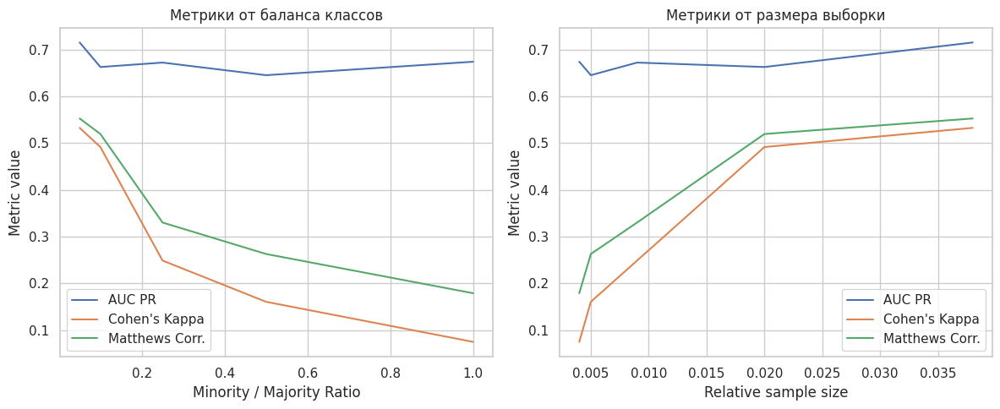

In [ ]:
df = pd.DataFrame(results)

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].plot(df["ratio"], df["AUC_PR"], label="AUC PR")
axs[0].plot(df["ratio"], df["Cohen_Kappa"], label="Cohen's Kappa")
axs[0].plot(df["ratio"], df["Matthews"], label="Matthews Corr.")
axs[0].set_title("Метрики от баланса классов")
axs[0].set_xlabel("Minority / Majority Ratio")
axs[0].set_ylabel("Metric value")
axs[0].legend()

axs[1].plot(df["rel_size"], df["AUC_PR"], label="AUC PR")
axs[1].plot(df["rel_size"], df["Cohen_Kappa"], label="Cohen's Kappa")
axs[1].plot(df["rel_size"], df["Matthews"], label="Matthews Corr.")
axs[1].set_title("Метрики от размера выборки")
axs[1].set_xlabel("Relative sample size")
axs[1].set_ylabel("Metric value")
axs[1].legend()

plt.tight_layout()
plt.show()

Даже такой наивный подход может дать относительно неплохие результаты и улучшить наши метрики. Тем не менее, сейчас мы никак не используем информацию о распределении объектов в выборке. Оказывается, что даже относительно простые эвристические правила могут заметно поднять нам качество - например, мы можем при отбрасывании использовать близость отдельных объектов мажорного класса к минорному и отбрасывать самые близкие. Протестируйте алгоритм [Near-Miss](https://www.site.uottawa.ca/~nat/Workshop2003/jzhang.pdf) на наших данных и постройте графики, аналогичные предыдущему пункту (также добавьте график с зависимостью качества от числа соседей).

In [ ]:
from imblearn.under_sampling import NearMiss
sampling_ratios = [1.0, 0.5, 0.25, 0.1, 0.05]
k_neighbors = [3, 8, 10, 15, 20]
results = []


for ratio in sampling_ratios:
  for neighbor in k_neighbors:
    nm = NearMiss(sampling_strategy=ratio, n_neighbors=neighbor)
    X_train_miss, y_train_miss = nm.fit_resample(X_train, y_train)

    model = CatBoostClassifier(verbose=0, random_state=42)
    model.fit(X_train_miss,  y_train_miss, eval_set=(X_val, y_val))

    y_proba = model.predict_proba(X_test)[:, 1]
    y_pred = (y_proba >= 0.5).astype(int)

    precision, recall, _ = precision_recall_curve(y_test, y_proba)
    auc_pr = auc(recall, precision)
    kappa = compute_cohen_kappa(y_test, y_pred)
    matthews = matthews_corrcoef(y_test, y_pred)

    class_counts     = Counter(y_train_miss)
    minority_count   = min(class_counts.values())
    majority_count   = max(class_counts.values())
    actual_ratio     = round(minority_count / majority_count, 3)
    rel_size         = round(len(y_train_miss) / len(y_train), 3)

    results.append({
        "ratio": round(minority_count / majority_count, 3),
        "rel_size": round(rel_size, 3),
        "k_neighbors": neighbor,
        "AUC_PR": auc_pr,
        "Cohen_Kappa": kappa,
        "Matthews": matthews
    })

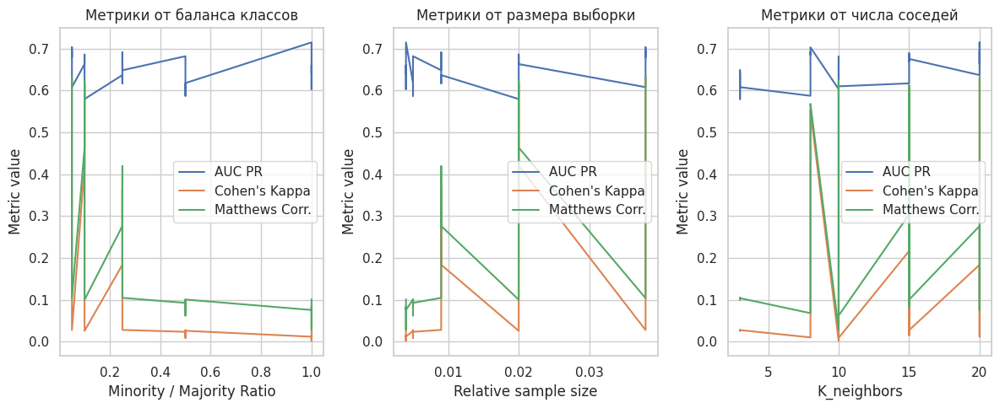

In [ ]:
df = pd.DataFrame(results)

fig, axs = plt.subplots(1, 3, figsize=(12, 5))

axs[0].plot(df["ratio"], df["AUC_PR"], label="AUC PR")
axs[0].plot(df["ratio"], df["Cohen_Kappa"], label="Cohen's Kappa")
axs[0].plot(df["ratio"], df["Matthews"], label="Matthews Corr.")
axs[0].set_title("Метрики от баланса классов")
axs[0].set_xlabel("Minority / Majority Ratio")
axs[0].set_ylabel("Metric value")
axs[0].legend()

axs[1].plot(df["rel_size"], df["AUC_PR"], label="AUC PR")
axs[1].plot(df["rel_size"], df["Cohen_Kappa"], label="Cohen's Kappa")
axs[1].plot(df["rel_size"], df["Matthews"], label="Matthews Corr.")
axs[1].set_title("Метрики от размера выборки")
axs[1].set_xlabel("Relative sample size")
axs[1].set_ylabel("Metric value")
axs[1].legend()

df_sorted = df.sort_values("k_neighbors")
axs[2].plot(df_sorted["k_neighbors"], df_sorted["AUC_PR"], label="AUC PR")
axs[2].plot(df_sorted["k_neighbors"], df_sorted["Cohen_Kappa"], label="Cohen's Kappa")
axs[2].plot(df_sorted["k_neighbors"], df_sorted["Matthews"], label="Matthews Corr.")
axs[2].set_title("Метрики от числа соседей")
axs[2].set_xlabel("K_neighbors")
axs[2].set_ylabel("Metric value")
axs[2].legend()

plt.tight_layout()
plt.show()

**Бонус (1 балл)**. imblearn также предлагает много различных методов для андерсэмплинга. Выберите что-нибудь еще из предлагаемого на свой вкус, опишите идею метода и протестируйте его.


**NeighbourhoodCleaningRule** - это алгоритм андерсэмплинга, который удаляет точки мажоритарного класса с учётом зашумлённости. Главная идея в том, что мы не просто случайно отбрасываем объекты, а целенаправленно удаляем те, которые выглядят как шум и могут ухудшать работу модели. Алгоритм опирается на правило Edited Nearest Neighbours — если объект отличается по классу от большинства своих ближайших соседей , то его удаляют. При этом чаще всего удаляются именно объекты мажоритарного класса, поскольку они искажают границу между классами.

Статья:

[1] J. Laurikkala, “Improving identification of difficult small classes by balancing class distribution,” Springer Berlin Heidelberg, 2001.

In [ ]:
from imblearn.under_sampling import NeighbourhoodCleaningRule

In [ ]:
sm_ncr = NeighbourhoodCleaningRule()
X_res_ncr, y_res_ncr = sm_ncr.fit_resample(X_train, y_train)

model_ncr = CatBoostClassifier(verbose=0, random_state=42)
model_ncr.fit(
    X_res_ncr, y_res_ncr,
    eval_set=(X_val, y_val),
    use_best_model=True
)

y_proba_ncr = model_ncr.predict_proba(X_test)[:, 1]
y_pred_ncr = (y_proba_ncr >= 0.5).astype(int)

precision_ncr, recall_ncr, _ = precision_recall_curve(y_test, y_proba_ncr)
auc_pr_ncr = auc(recall_ncr, precision_ncr)

kappa_ncr = compute_cohen_kappa(y_test, y_pred_ncr)
matthews_ncr = matthews_corrcoef(y_test, y_pred_ncr)

table_6 = [
    ['NeighbourhoodCleaningRule', auc_pr_ncr, kappa_ncr, matthews_ncr]
]
print(tabulate(table_6, headers=["Model", "AUC_PR", "Cohen_Kappa", "Matthews"]))

Model                        AUC_PR    Cohen_Kappa    Matthews
-------------------------  --------  -------------  ----------
NeighbourhoodCleaningRule  0.679989       0.736671    0.746041


# Часть 2. Поиск аномалий.

Как вы могли заметить, методы балансировки выборок очень часто могут привести к не самым лучшим результатам из-за того, что они по сути искажают информацию о реальном распределении данных - в реальности обычно требуется долгий подбор в принципе работоспособных для задачи методов и их аккуратная настройка.

Теперь давайте попробуем слегка сменить постановку задачи и переключиться на задачу "одноклассовой" классификации, то есть - поиска *аномалий* в выборке. В общем-то, это вполне согласуется с нашей областью работы - мы действительно можем назвать мошеннические транзакции аномальньми (как интуитивно, так и на основании наблюдаемой балансировки данных).

Стоит отметить, что методы обнаружения аномалий чаще всего относятся к классу методов обучения без учителя. Это дает некоторый положительный эффект - нам не обязательно нужно тратить время на разметку данных (тем не менее, для контроля качества какую-то часть разметить все-таки придется). Впрочем, чаще всего перфоманс таких методов оказывается заметно хуже, чем у честного обучения с учителем (если мы можем себе его позволить).



**Задание 4. (3 балла).** На занятиях вы разбирали схожий с Random Forest подход для детекции аномалий без известной разметки данных, называемый Isolation Forest. Напомним суть: на этапе обучения мы создаем ансамбль из решающих деревьев, в котором признак и порог на каждую вершину подбираются случайно. Затем мы считаем для объектов оценку аномальности через длину пути до соответствующего листа в каждом дереве.

В данном задании вам предлагается реализовать модификацию данного алгоритма, известную как Extended Isolation Forest. В ней мы на каждом шаге будем определять не порог для признака, а полноценную случайную гиперплоскость, разбивающую выборку на 2 части. С детальным описанием вы можете ознакомиться [здесь](https://arxiv.org/pdf/1811.02141.pdf).

Ниже приведен шаблон кода. Постарайтесь работать в его рамках (минорные изменения вполне допустимы, главное не переворачивайте всю структуру с ног на голову).

**NB**: будем считать, что в нашем датасете нет категориальных признаков - можете не заморачиваться с их обработкой (но в общем случае, это будет важно).

**Советы**:
 - Численные признаки лучше предобработать надлежащим образом.
 - Возможно, вам поможет выбрасывание некоторых признаков.
 - Внимательно следите за знаками.
 - Не игнорируйте документирующие строки.
 - Вероятнее всего, вы не сможете приблизиться по качеству к supervised-решениям. Если у вас не получается это сделать (но вы уверены в своей правоте), не стоит тратить слишком много времени на поиск ошибок.
- При желании, можете вынести этот код в отдельный файл и приложить его к ноутбуку. Он довольно громоздкий и в ноутбуке такое плохо читается.


**Бонусы (каждый по 0.5)**:
- Сделайте ваш EIF параллельным (`multiprocessing`, `joblib`).
- Добавьте возможность откатиться к дефолтному варианту Isolation Forest. (порассуждайте, как можно реализовать это в данной модели?):


In [ ]:
from joblib import Parallel,delayed

In [ ]:
def c_factor(n):
    """
    Computes average path length for an unsuccessful search in a binary search tree.
    Params:
        n: int - number of data points for BST
    """
    if n <= 1:
        return 0.0
    return 2.0*(np.log(n-1)+0.5772156649) - (2.0*(n-1)/n)

def calc_height(X, node):
    """
    Calculates anomaly scores for sample in a recursive manner.
    Params:
        X: np.array - current sample, available to node


        node: Node - current tree node

    Returns:
        scores: int, float or np.array - anomaly scores for sample
    """
    return np.array([_path_length(x, node) for x in X])

def _path_length(x, node, depth=0):

    if node.kind == 'external' or node.size <= 1:
        return depth + c_factor(node.size)
    projection = np.dot(x, node.w)
    if projection <= node.b:
        return _path_length(x, node.left, depth + 1)
    else:
        return _path_length(x, node.right, depth + 1)

def _score_one_tree(tree, X, c):
    h = calc_height(X, tree.root)
    return 2.0 ** (-h / c)

class Node(object):
    """
    A single node object for each tree. Contains information on height, current data,
    splitting hyperplane and children nodes.

    Attributes:
        X: np.array - data available to current node
        size: int - length of available data

        depth: int - depth of node

        left: Node - left child
        right: Node - right child

        kind: str - either "internal" or "external", indicates the type of current node

        w: np.array - normal vector for the splitting hyperplane
        b: float - intercept term for the splitting hyperplane
    """
    def __init__(self, X, depth, left, right, kind, w, b):
        """
        Node(h, left, right, kind, w, b)
        Represents the node object.

        Params:
            X: np.array - data available to current node
            depth: int - depth of node

            left: Node - left child
            right: Node - right child

            kind: str - either "internal" or "external", indicates the type of current node

            w: np.array - normal vector for the splitting hyperplane
            b: float - intercept term for the splitting hyperplane

        """
        self.size = len(X)

        self.depth = depth

        self.left = left
        self.right = right

        self.kind = kind

        self.w = w
        self.b = b

    def __repr__(self):
        """
        For convenience only.
        """
        return f"Node(size={self.size}, depth={self.depth}, kind={self.kind})"

class RandomizedTree(object):
    """
    Single randomized tree object. Stores root and its depth (tree is built recursively).
    Attributes:
        depth: int - current tree depth

        max_depth: int - maximum tree depth

        root: Node - root node

        internal_count: int - number of internal nodes

        external_count: int - number of external nodes

    """
    def __init__(self, X, max_depth, extension_level=2):
        """
        Single randomized tree object. Stores root and its depth (tree is built recursively).
        Params:
            X: np.array - train sample
            max_depth: int - maximum tree depth

        """
        self.depth = 0
        self.max_depth = max_depth
        self.extension_level = extension_level
        self.internal_count = 0
        self.external_count = 0

        self.root = self.grow(X, 0)

    def __repr__(self):
        """
        For convenience only.
        """

        return f"RandomizedTree(depth={self.depth}, max_depth={self.max_depth}, n_internal={self.internal_count}, n_external={self.external_count})"



    def grow(self, X, depth):
        """
        Grow tree in a recursive manner.
        Params:
            X: np.array - available train sample

            depth: int - current tree depth

        Returns:
            node: Node - a trained node with separating hyperplane data.
                         Node provides access to children if necessary (these are built recursively)
        """
        if depth > self.depth:
          self.depth = depth

        n, d = X.shape
        if depth >= self.max_depth or n <= 1:
            self.external_count += 1
            return Node(X, depth, None, None, 'external', None, None)

        self.internal_count += 1
        w = np.random.randn(d)
        if self.extension_level < d:
            zero_idx = np.random.choice(d, size=d - self.extension_level, replace=False)
            w[zero_idx] = 0

        w = w / np.linalg.norm(w)
        projections = X.dot(w)
        b = np.random.uniform(projections.min(), projections.max())

        X_l = X[projections <= b]
        X_r = X[projections > b]

        left = self.grow(X_l, depth+1)
        right = self.grow(X_r, depth+1)

        return Node(X, depth, left, right, 'internal', w, b)

    def score_samples(self, X):
        """
        Calculate anomaly scores for given data. You may utilize outer function `calc_height`.
        Params:
            X: np.array - data to be evaluated

        Returns:
            scores: np.array - estimated anomaly scores
        """
        h = calc_height(X, self.root)
        n = self.root.size
        c = c_factor(n)
        return 2.0 ** (-h / c)


class ExtendedIsolationForest(object):
    """
    Extended Isolation Forest object. Stores training data and trained randomized trees.
    Attributes:
        n_trees: int - number of Randomized Trees

        max_depth: int - maximum depth of each tree

        subsample_rate: float - draw `subsample_rate * X.shape[0]` samples for each tree

        trees: list - container for trained trees

        contamination: float - estimated fraction of anomaly samples in data. Used for thresholding

    """

    def __init__(self, n_trees, subsample_rate, max_depth=None, contamination=0.01, extension_level=2):
        """
        Extended Isolation Forest object. Stores training data and trained randomized trees.
        Params:
            n_trees: int - number of Randomized Trees

            subsample_rate: float - draw `subsample_rate * X.shape[0]` samples for each tree

            max_depth: int or None - maximum depth of each tree. Defaults to ceil(log_2(subsample_size)) if not provided

            contamination: float - estimated fraction of anomaly samples in data. Used for thresholding

        """
        self.n_trees = n_trees
        self.max_depth = max_depth
        self.subsample_rate = subsample_rate
        self.extension_level = extension_level
        self.trees = []
        self.contamination = contamination
        self.is_fit = False

    def __repr__(self):
        """For convenience only."""

        return f"ExtendedIsolationForest(n_trees={self.n_trees}, max_depth={self.max_depth}, subsample_rate={self.subsample_rate}, contamination={self.contamination}, is_fit={self.is_fit})"

    def fit(self, X):
        """
        Fit EIF to new data.
        Params:
            X: np.array - 2d array of samples
        """
        n, d = X.shape
        subsample_size = int(np.ceil(self.subsample_rate * n))
        idx_list = [
            np.random.choice(n, subsample_size, replace=False)
            for _ in range(self.n_trees)
        ]
        self.trees = Parallel(n_jobs=-1, verbose=5)(
            delayed(RandomizedTree)(X[idx], self.max_depth, self.extension_level)
            for idx in idx_list
            )
        self.is_fit = True
        return self

    def score_samples(self, X):
        """
        Estimate (normalized) anomaly score for each given sample
        Params:
            X: np.array - new samples

        Returns:
            scores: np.array - anomaly scores (larger value means higher probability of a sample being an outlier)
        """
        n, _ = X.shape

        n0 = self.trees[0].root.size
        c  = c_factor(n0)

        tree_scores = Parallel(n_jobs=-1, verbose=5)(
            delayed(_score_one_tree)(tree, X, c)
         for tree in self.trees)
        scores = np.mean(tree_scores, axis=0)

        return scores

    def predict(self, X):
        """
        Predict if given samples are outliers.
        Params:
            X: np.array - new samples

        Returns:
            labels: np.array - anomaly labels (1 for outliers, 0 for inliers)
        """
        scores = self.score_samples(X)
        thresh = np.quantile(scores, 1 - self.contamination)
        labels = (scores >= thresh).astype(int)
        return labels

**Задание 5. (1 балл).** Протестируйте вашу реализацию EIF и подберите оптимальные гиперпараметры (наш метод не использует разметку, поэтому можете попробовать делать это на обучающей выборке). Сравните ее с обычным IF из `sklearn` (желательно делать это на одних и тех же параметрах). Удалось ли сделать лучше?

In [ ]:
from sklearn.ensemble import IsolationForest

In [ ]:
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc

In [ ]:
def count_metrics(y_true, y_pred):
  roc_auc = roc_auc_score(y_true, y_pred)
  precision, recall, _ = precision_recall_curve(y_true, y_pred)
  auc_prc = auc(recall, precision)
  return roc_auc, auc_prc

In [ ]:
transactions_for_train = df[df['Time'] < threshold].sort_values('Time')
X_train = transactions_for_train.drop(columns=['Class'])
y_train = transactions_for_train['Class']

X_val = val.drop(columns=['Class'])
y_val = val['Class']

X_test = test.drop(columns=['Class'])
y_test = test['Class']

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

In [ ]:
model_if = IsolationForest(random_state=42)
model_if.fit(X_train_scaled)
if_scores = -model_if.decision_function(X_test_scaled)

n_samples = len(X_train_scaled)
subsample_size = 0.5 * n_samples
max_depth = int(np.ceil(np.log2(subsample_size)))

model_eif = ExtendedIsolationForest(
    n_trees=100,
    subsample_rate=0.5,
    max_depth=max_depth,
    contamination=0.01,
    extension_level=2
)
model_eif.fit(X_train_scaled)
eif_scores = model_eif.score_samples(X_test_scaled)

roc_auc_if, auc_prc_if = count_metrics(y_test, if_scores)
roc_auc_eif, auc_prc_eif = count_metrics(y_test, eif_scores)

table_7 = [
    ['IsolationForest', roc_auc_if, auc_prc_if],
    ['ExtendedIsolationForest', roc_auc_eif, auc_prc_eif]
]
print(tabulate(table_7, headers=["Model", "AUC_ROC", "AUC_PRC"]))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   39.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:  1.3min


Model                      AUC_ROC    AUC_PRC
-----------------------  ---------  ---------
IsolationForest           0.915858  0.0220555
ExtendedIsolationForest   0.923306  0.0336057


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.8min finished


Возможно, ваш алгоритм выдал большие оценки объектам с негативной разметкой. Постарайтесь выбрать несколько таких объектов и доступно объяснить (= с кодом и графиками), почему так вышло:

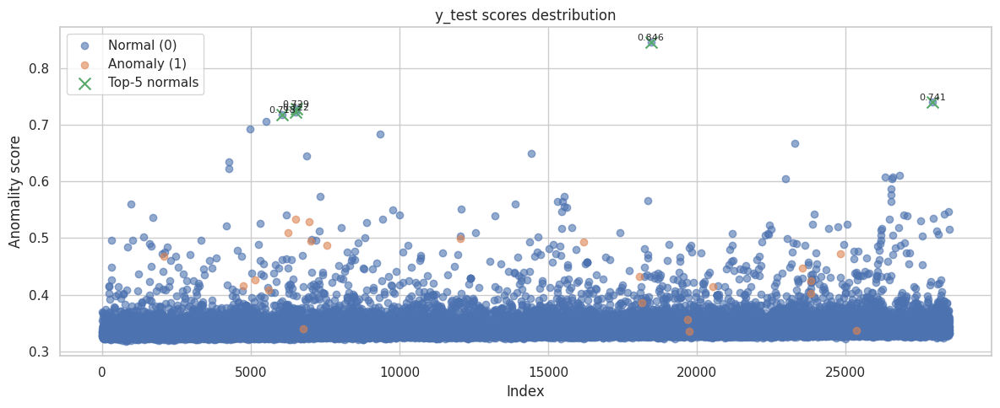

In [ ]:
n_samples = len(y_test)
indices   = np.arange(n_samples)

mask_normal  = (y_test == 0)
mask_anomaly = (y_test == 1)

neg_idx      = indices[mask_normal]
neg_scores   = eif_scores[mask_normal]
top5_local   = np.argsort(neg_scores)[::-1][:5]
top5_global  = neg_idx[top5_local]
top5_scores  = neg_scores[top5_local]

plt.figure(figsize=(12, 5))
plt.scatter(indices[mask_normal],  eif_scores[mask_normal],  label='Normal (0)', marker='o', alpha=0.6)
plt.scatter(indices[mask_anomaly], eif_scores[mask_anomaly], label='Anomaly (1)', marker='o', alpha=0.6)

plt.scatter(top5_global, top5_scores, s=100, marker='x', label='Top-5 normals')

for idx, score in zip(top5_global, top5_scores):
    plt.text(idx, score, f'{score:.3f}', ha='center', va='bottom', fontsize=8)

plt.xlabel('Index')
plt.ylabel('Anomality score')
plt.title('y_test scores destribution')
plt.legend()
plt.tight_layout()
plt.show()

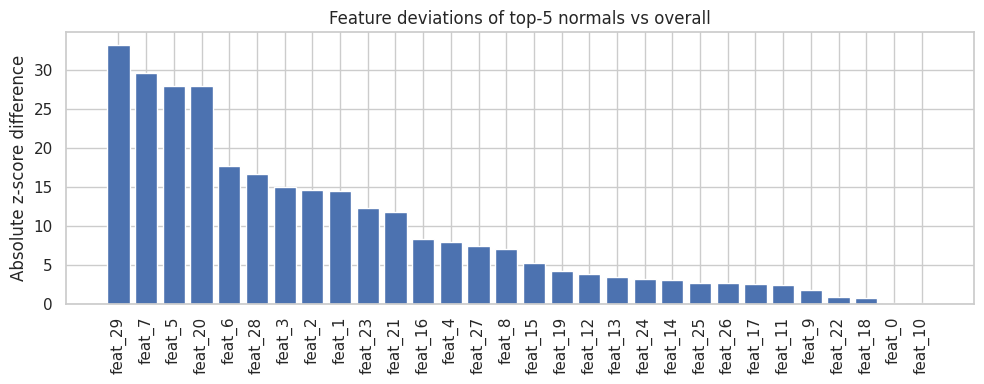

In [ ]:
mask_normal  = (y_test == 0)
neg_idx      = np.where(mask_normal)[0]
neg_scores   = eif_scores[mask_normal]
top5_local   = np.argsort(neg_scores)[::-1][:5]
top5_global  = neg_idx[top5_local]

X_all  = X_test_scaled
X_top5 = X_test_scaled[top5_global]

mean_all   = X_test_scaled.mean(axis=0)
std_all    = X_test_scaled.std(axis=0, ddof=0)
mean_top5  = X_top5.mean(axis=0)
diff       = mean_top5 - mean_all
z_diff     = diff / std_all

feature_names = [f"feat_{i}" for i in range(X_test_scaled.shape[1])]
df_stats = pd.DataFrame({
    "mean_all": mean_all,
    "mean_top5": mean_top5,
    "std_all": std_all,
    "diff": diff,
    "z_diff": z_diff
}, index=feature_names)

z_sorted = df_stats["z_diff"].abs().sort_values(ascending=False)

plt.figure(figsize=(10, 4))
plt.bar(z_sorted.index, z_sorted.values)
plt.xticks(rotation=90)
plt.ylabel("Absolute z-score difference")
plt.title("Feature deviations of top-5 normals vs overall")
plt.tight_layout()
plt.show()

Некоторые объекты класса 0 оказались в хвостах распределения признаков и заметно отклонились от средней группы нормальных точек, поэтому алгоритм EIF посчитал их сильно изолированными и присвоил большие аномальные скоры.

**Задание 6. (1 балл).** `sklearn` также предлагает нам и другие методы для поиска аномалий. В этом задании мы предлагаем вам сделать следующее:

Для начала попробуйте использовать методы Local Outlier Factor и One-Class SVM. Сравните результаты с IF и EIF.  

In [ ]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

In [ ]:
lof = LocalOutlierFactor(novelty=True)
lof.fit(X_train_scaled)
lof_scores = -lof.decision_function(X_test_scaled)

svm = OneClassSVM()
svm.fit(X_train_scaled)
svm_scores = -svm.decision_function(X_test_scaled)

roc_auc_lof, auc_prc_lof = count_metrics(y_test, lof_scores)
roc_auc_svm, auc_prc_svm = count_metrics(y_test, svm_scores)

table_8 = [['IsolationForest', roc_auc_if, auc_prc_if],
    ['ExtendedIsolationForest', roc_auc_eif, auc_prc_eif],
    ['LocalOutlierFactor', roc_auc_lof, auc_prc_lof],
    ['OneClassSVM', roc_auc_svm, auc_prc_svm]
]
print(tabulate(table_8, headers=["Model", "AUC_ROC", "AUC_PRC"]))

Model                      AUC_ROC      AUC_PRC
-----------------------  ---------  -----------
IsolationForest           0.915858  0.0220555
ExtendedIsolationForest   0.923306  0.0336057
LocalOutlierFactor        0.48418   0.000784561
OneClassSVM               0.937011  0.0306552


У вас началась депрессия из-за плохих метрик? Не беда! Сейчас давайте сделаем так: все методы, опробованные в этой части, попробуем задействовать для создания дополнительных признаков в данных. Проделайте это (не забудьте, что обучаться здесь нужно на трейне). Теперь возьмите лучшую модель из предыдущей части и обучите на новых данных. Смогли ли unsupervised-методы повысить вам качество?

In [ ]:
if_scores_train = -model_if.decision_function(X_train_scaled)
if_scores_val  = -model_if.decision_function(X_val_scaled)
if_scores_test  = -model_if.decision_function(X_test_scaled)

eif_scores_train = model_eif.score_samples(X_train_scaled)
eif_scores_val = model_eif.score_samples(X_val_scaled)
eif_scores_test  = model_eif.score_samples(X_test_scaled)

svm_scores_train = -svm.decision_function(X_train_scaled)
svm_scores_val = -svm.decision_function(X_val_scaled)
svm_scores_test = -svm.decision_function(X_test_scaled)

lof_scores_train = -lof.decision_function(X_train_scaled)
lof_scores_test = -lof.decision_function(X_test_scaled)
lof_scores_val = -lof.decision_function(X_val_scaled)


if_tr = if_scores_train.reshape(-1, 1)
if_val  = if_scores_val.reshape(-1, 1)
if_te = if_scores_test.reshape(-1, 1)
eif_tr = eif_scores_train.reshape(-1, 1)
eif_val = eif_scores_val.reshape(-1, 1)
eif_te = eif_scores_test.reshape(-1, 1)
svm_tr = svm_scores_train.reshape(-1, 1)
svm_val = svm_scores_val.reshape(-1, 1)
svm_te = svm_scores_test.reshape(-1, 1)
lof_tr = lof_scores_train.reshape(-1, 1)
lof_te = lof_scores_test.reshape(-1, 1)
lof_val = lof_scores_val.reshape(-1, 1)

X_train_aug = np.hstack([X_train_scaled, if_tr,  eif_tr, svm_tr, lof_tr])
X_test_aug  = np.hstack([X_test_scaled,  if_te,   eif_te, svm_te, lof_te])
X_val_aug = np.hstack([X_val_scaled, if_val, eif_val, svm_val, lof_val])

sm_adj= SMOTE(sampling_strategy=0.1, random_state=42)
X_res_adj, y_res_adj = sm_adj.fit_resample(X_train_aug, y_train)

model_adj = CatBoostClassifier(verbose=0)
model_adj.fit(
    X_res_adj, y_res_adj,
    eval_set=(X_val_aug, y_val)
)

y_proba_smote_adj = model_adj.predict_proba(X_test_aug)[:, 1]
y_smote_adj = (y_proba_smote_adj>= 0.5).astype(int)
precision_smote_adj, recall_smote_adj, _ = precision_recall_curve(y_test, y_proba_smote_adj)
auc_precision_recall_smote_adj = auc(recall_smote_adj, precision_smote_adj)

kappa_smote_adj = compute_cohen_kappa(y_test, y_smote_adj)
matthews_smote_adj = matthews_corrcoef(y_test, y_smote_adj)


table_4 = [
           ['SMOTE Part+CatBoost+NewFeatures', auc_precision_recall_smote_adj, kappa_smote_adj, matthews_smote_adj]]
print(tabulate(table_4, headers=["Model", "AUC_PR", "Cohen_Kappa", "Matthews"]))

Model                              AUC_PR    Cohen_Kappa    Matthews
-------------------------------  --------  -------------  ----------
SMOTE Part+CatBoost+NewFeatures  0.727412       0.710883    0.711059


Качество модели понизилось из-за мультиколлинеарности, признаки, добавленные с помощью unsupervised-алгоритмов, сильно скоррелированы между собой и с исходными фичами.

**Бонус. (0.1 балла).**

При сдаче проверяющий запустит следующую клетку один раз. Если она даст положительный результат, вы получите 0.1 бонусных балла. Если она даст отрицательный результат, вы получите -0.1 бонусных балла.

Если вы хотите отказаться от сдачи данного задания, допишите "хочу" после двоеточия: `your text here`

Ниже вы можете попрактиковаться и оценить ваши силы (изменять код ячейки запрещается!)

In [ ]:
import random

rng = random.SystemRandom(0)
rng.uniform(-1.0, 1.0)

0.5035771924989576